In [1]:
import json
from yolo_helpers import create_yolo_targets, decode_yolo_predictions, remove_bg

import torch
from matplotlib import pyplot as plt

In [2]:
def test_create_yolo_targets_basic():
    anchors = [[32, 32], [64, 64], [128, 128]]
    targets = [{
        'boxes': torch.tensor([[50, 50, 150, 150]]),
        'labels': torch.tensor([0])
    }]

    yolo_targets = create_yolo_targets(targets, anchors)

    assert yolo_targets.shape == (1, 3, 7, 14, 14)

    assert (yolo_targets[:, :, 4] == 1.0).any()

    assert (yolo_targets[:, :, 5] == 1.0).any()


def test_encode_decode_roundtrip():
    anchors = [[32, 32], [64, 64]]
    original_targets = [{
        'boxes': torch.tensor([[56, 56, 168, 168]]),
        'labels': torch.tensor([1])
    }]

    yolo_targets = create_yolo_targets(
        original_targets, anchors, grid_size=14, image_size=224)

    predictions = yolo_targets.clone()

    decoded = decode_yolo_predictions(
        predictions, anchors=anchors, grid_size=14, image_size=224, conf_threshold=0.7)

    assert len(decoded[0]['boxes']) > 0

    original_box = original_targets[0]['boxes'][0]
    decoded_box = decoded[0]['boxes'][0]

    tolerance = 0.2 * 224
    for i in range(4):
        assert abs(original_box[i] - decoded_box[i]) < tolerance


def test_empty_targets():
    anchors = [[32, 32], [64, 64]]
    empty_targets = [{
        'boxes': torch.empty(0, 4),
        'labels': torch.empty(0, dtype=torch.long)
    }]

    yolo_targets = create_yolo_targets(empty_targets, anchors)

    assert torch.all(yolo_targets == 0)


def test_decode_with_low_confidence():
    predictions = torch.zeros(1, 2, 7, 14, 14)

    predictions[0, 0, 4, 7, 7] = -0.85
    predictions[0, 0, 5, 7, 7] = 1.0

    decoded = decode_yolo_predictions(
        predictions, anchors=[[1, 1]], conf_threshold=0.5)

    assert len(decoded[0]['boxes']) == 0

    decoded_low = decode_yolo_predictions(
        predictions, anchors=[[1, 1]], conf_threshold=0.2)

    assert len(decoded_low[0]['boxes']) > 0


def test_multiple_objects_multiple_batches():
    anchors = [[40, 40], [80, 80]]
    targets = [
        {
            'boxes': torch.tensor([[30, 30, 90, 90], [130, 130, 190, 190]]),
            'labels': torch.tensor([0, 1])
        },
        {
            'boxes': torch.tensor([[60, 60, 120, 120]]),
            'labels': torch.tensor([0])
        }
    ]

    yolo_targets = create_yolo_targets(targets, anchors)

    assert yolo_targets.shape[0] == 2

    batch0_objects = (yolo_targets[0, :, 4] == 1.0).sum()
    batch1_objects = (yolo_targets[1, :, 4] == 1.0).sum()

    assert batch0_objects == 2
    assert batch1_objects == 1

    assert (yolo_targets[0, :, 5] == 1.0).sum() >= 1
    assert (yolo_targets[0, :, 6] == 1.0).sum() >= 1
    assert (yolo_targets[1, :, 5] == 1.0).sum() >= 1



test_create_yolo_targets_basic()
test_decode_with_low_confidence()
test_empty_targets()
test_encode_decode_roundtrip()
test_multiple_objects_multiple_batches()
print("All tests passed!!!")


All tests passed!!!


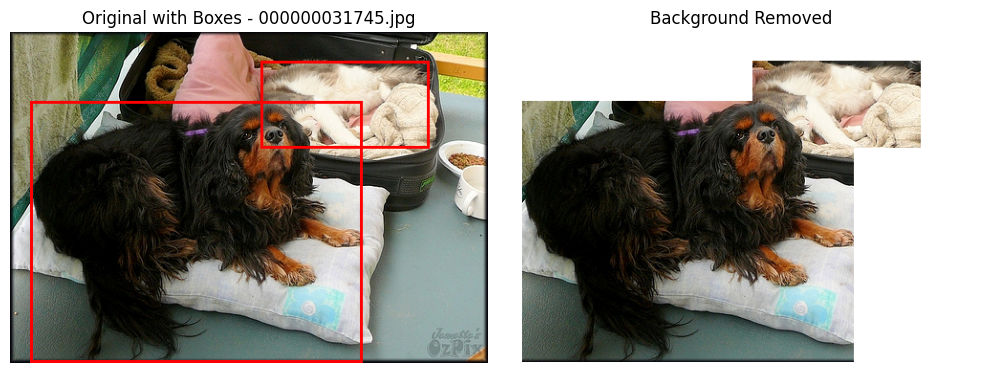

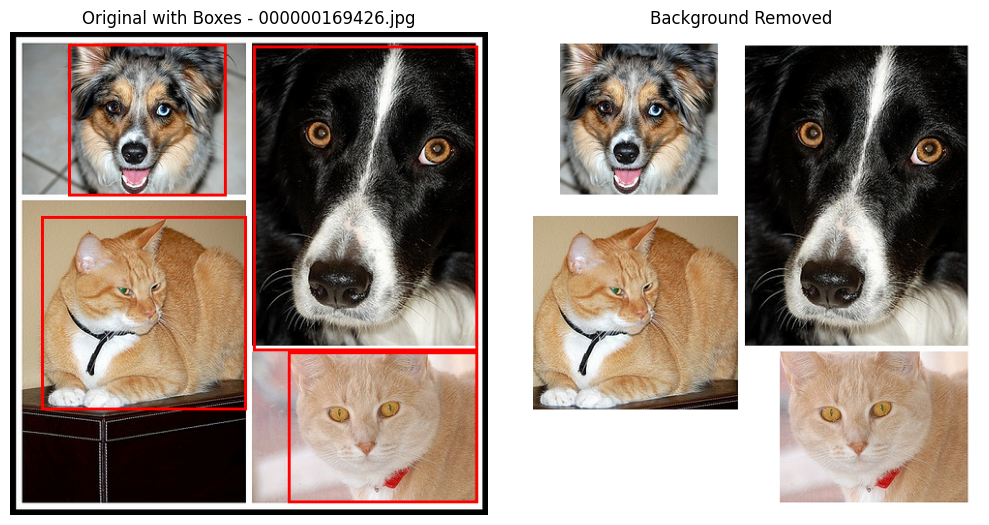

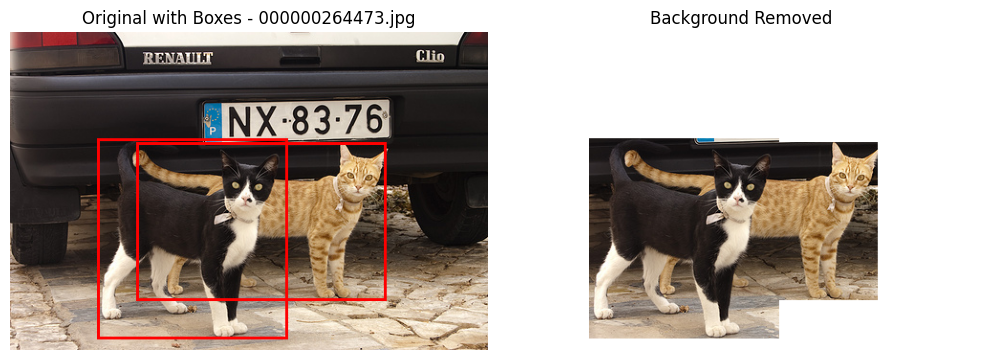

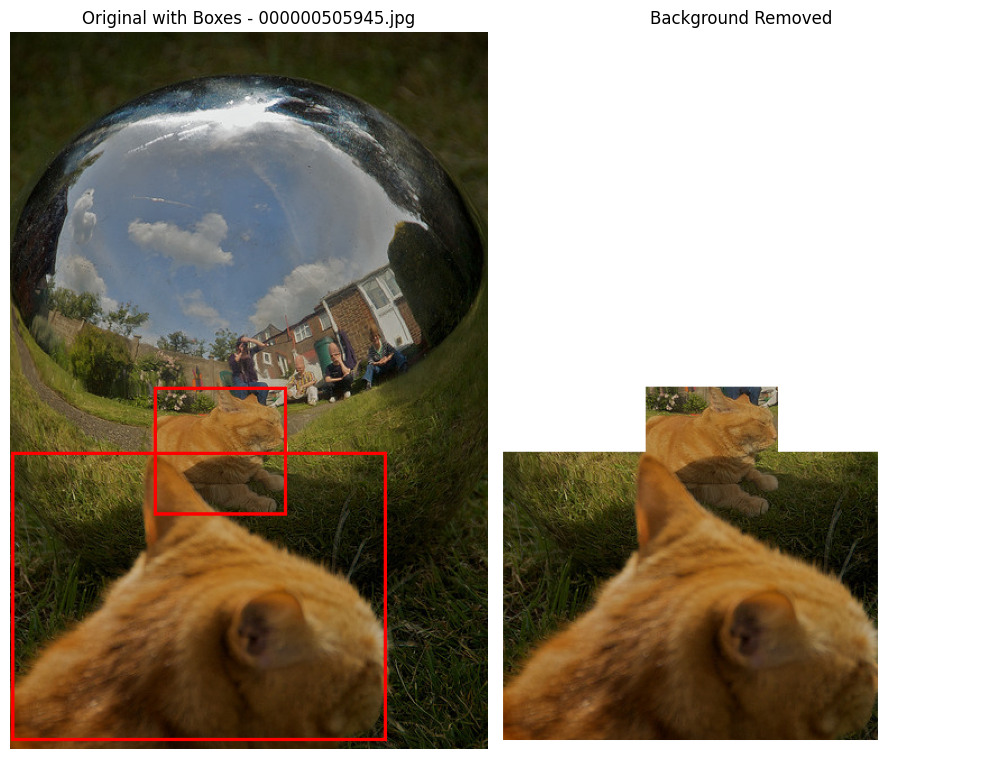

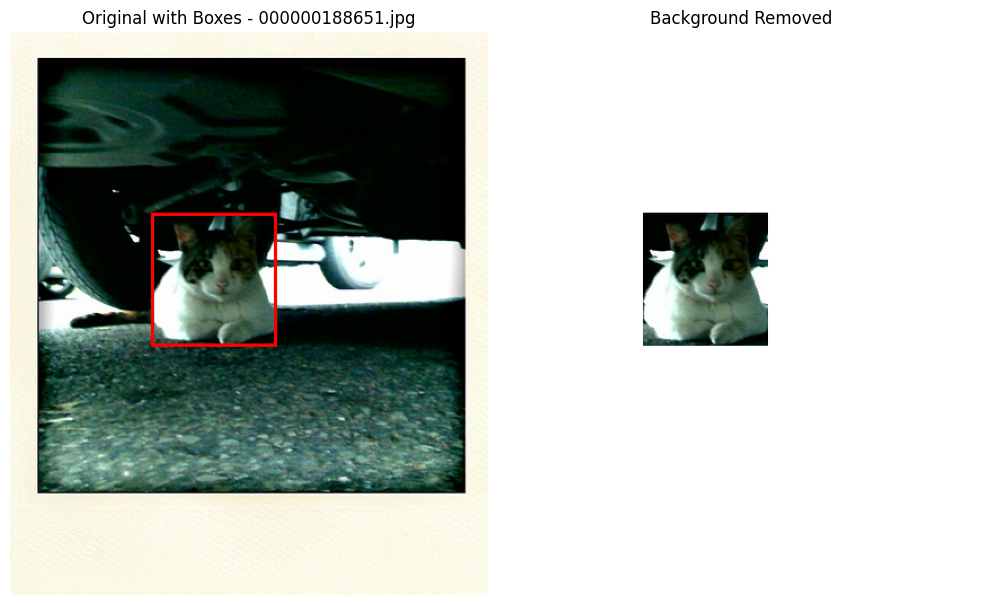

...

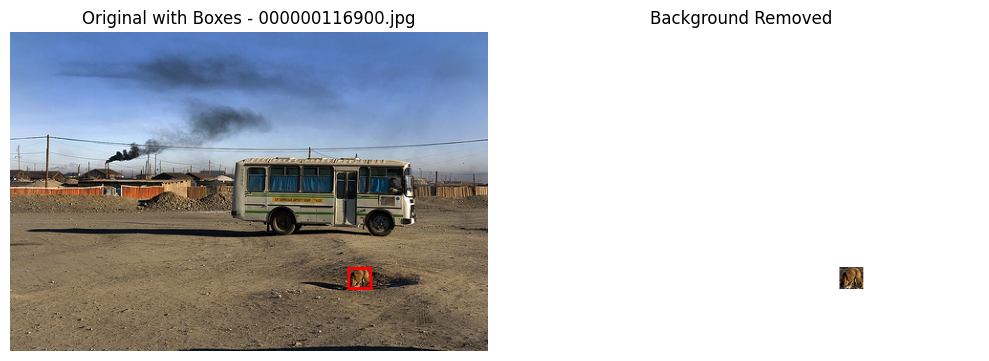

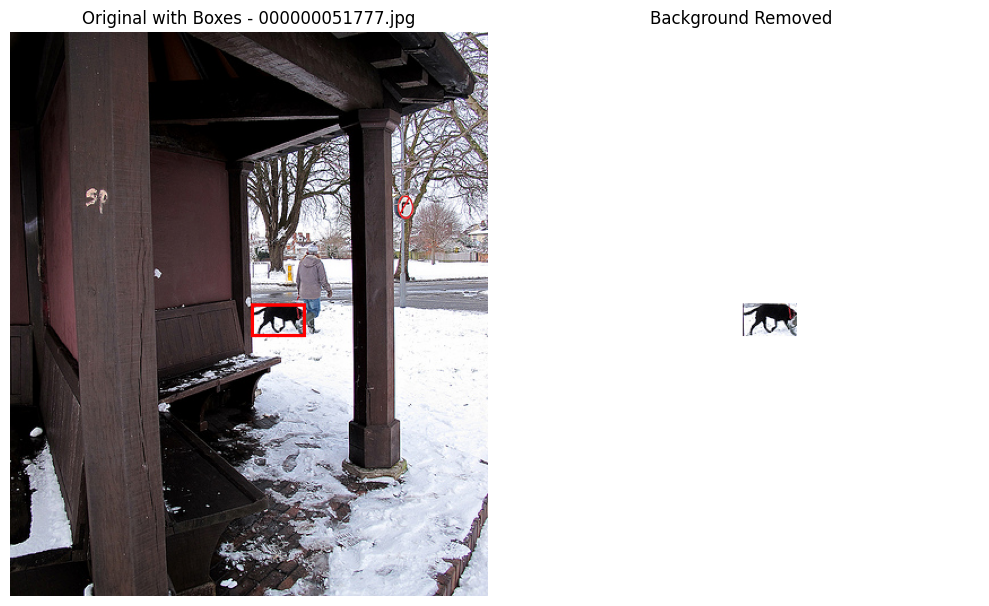

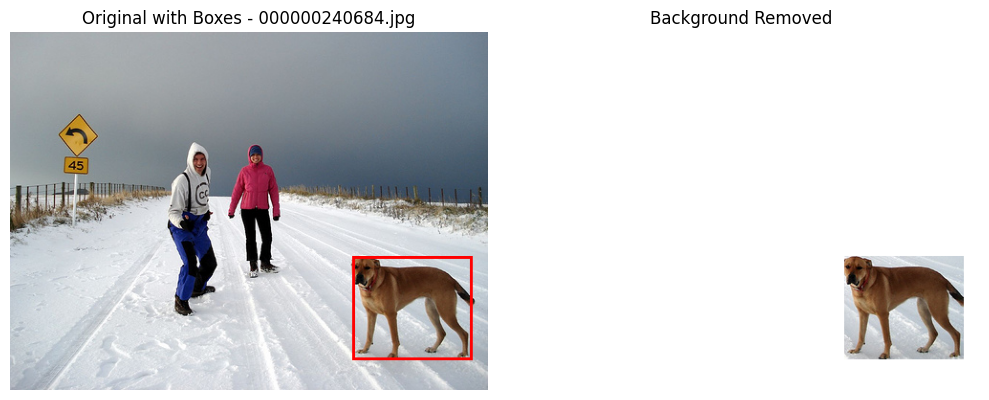

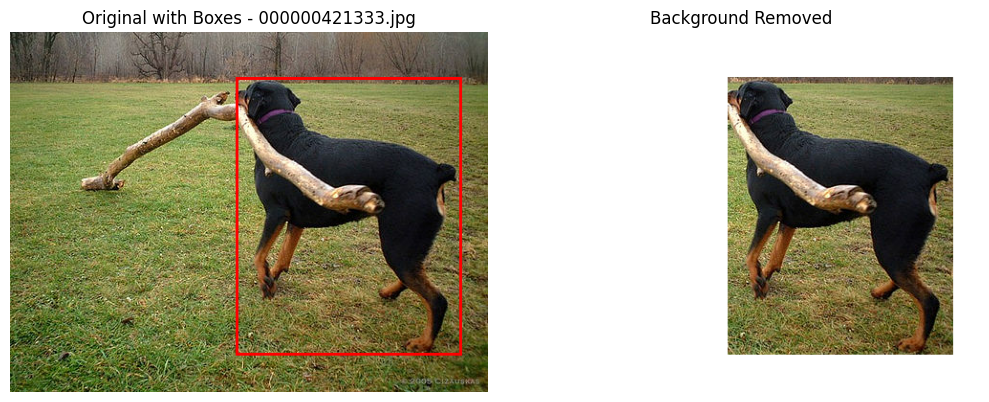

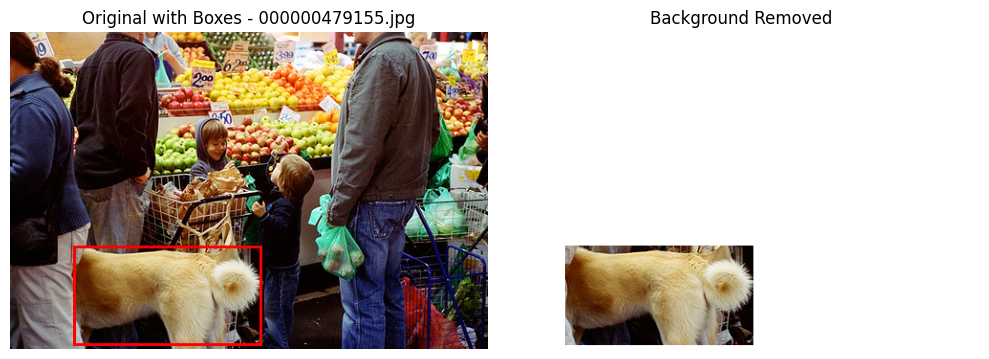

In [3]:
with open('cat_dog_images/cat_dog_annotations.json', 'r') as f:
    annotations = json.load(f)

for i, annotation in enumerate(annotations):
    if i % 200 == 0: 
        bboxes = annotation['bboxes']
        input_path = f"./cat_dog_images/{annotation['filename']}"
        original_with_boxes, result = remove_bg(input_path, bboxes=bboxes)
        
        fig, axes = plt.subplots(1, 2, figsize=(10, 15))
        axes[0].imshow(original_with_boxes)
        axes[0].set_title(f"Original with Boxes - {annotation['filename']}")
        axes[0].axis('off')
        
        axes[1].imshow(result)
        axes[1].set_title("Background Removed")
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()
        plt.close(fig) 